# Read MODIS datacube

In [4]:
import dask
import distributed
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

import xarray as xr

mpl.rcParams["figure.dpi"] = 180

In [5]:
cluster = distributed.LocalCluster(
    n_workers=48,
    processes=True,
    threads_per_worker=6,
    local_directory="/home/dcherian/.dask_worker/",
    dashboard_address=":9999",
    memory_limit="12GB",
)
cluster

/home/dcherian/miniconda3/envs/dcpy/lib/python3.7/site-packages/distributed/node.py:244: UserWarning: Port 9999 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 37585 instead
  http_address["port"], self.http_server.port


In [3]:
client = distributed.Client(cluster)

# HDF5 to zarr

In [6]:
import h5py

q5file = "/project/mrgoodbar/dcherian/shelfeddy/datasets/MODISAquaSST-v2014-qf4-42N-49N-127W-123.9W.h5"
q5 = h5py.File(q5file, mode="r")
q5.keys()

<KeysViewHDF5 ['cutoff', 'latgrid', 'latlims', 'longrid', 'lonlims', 'scalarvar', 'time']>

In [5]:
sst_arr = dask.array.from_array(q5["scalarvar"], chunks="auto")
lon = np.array(q5["longrid"])
lat = np.array(q5["latgrid"])
cutoff = np.array(q5["cutoff"])
time = np.array(q5["time"])

In [11]:
sst = xr.DataArray(
    sst_arr,
    dims=["lat", "lon", "time"],
    coords={"lat": lat, "lon": lon, "time": time},
    name="SST",
)
sst.time.attrs["units"] = "days since 1981-01-01 00:00:00"
sst = xr.decode_cf(sst.to_dataset()).to_array().drop("variable").squeeze()
sst.name = "sst"
sst

,Array,Chunk
Bytes,118.69 GB,112.67 MB
Shape,"(1402, 621, 17040)","(945, 621, 24)"
Count,4261 Tasks,1420 Chunks
Type,float64,numpy.ndarray


In [13]:
sst.attrs["quality_level"] = "≥ 4"
sst.to_dataset().to_zarr("/project/mrgoodbar/dcherian/shelfeddy/datasets/modis-aqua-v2014-ql4.zarr", consolidated=True)

# Read data

In [8]:
sst = xr.open_zarr("/project/mrgoodbar/dcherian/shelfeddy/datasets/modis-aqua-v2014-ql4.zarr", consolidated=True).sst
sst

,Array,Chunk
Bytes,118.69 GB,112.67 MB
Shape,"(1402, 621, 17040)","(945, 621, 24)"
Count,1421 Tasks,1420 Chunks
Type,float64,numpy.ndarray


In [9]:
etopo = xr.open_dataset("/home/dcherian/datasets/ETOPO2v2g_f4.nc4").z.sel(x=slice(-127, -124), y=slice(42, 49)).load()
etopo

<xarray.DataArray 'z' (y: 211, x: 91)>
array([[-3198., -2895., -2384., ...,   318.,   542.,   710.],
       [-3012., -2929., -2774., ...,   183.,   460.,   609.],
       [-2961., -2892., -2780., ...,   200.,   419.,   640.],
       ...,
       [-1155., -1009.,  -902., ...,   660.,   857.,   892.],
       [-1105.,  -947.,  -844., ...,   917.,   880.,   803.],
       [-1063.,  -889.,  -766., ...,   837.,   675.,   498.]],
      dtype=float32)
Coordinates:
  * x        (x) float32 -127.0 -126.96667 -126.933334 ... -124.03333 -124.0
  * y        (y) float32 42.0 42.033333 42.066666 ... 48.933334 48.966667 49.0
Attributes:
    long_name:     z
    actual_range:  [-10722.   8046.]

# Sanity checks

## Simple plot

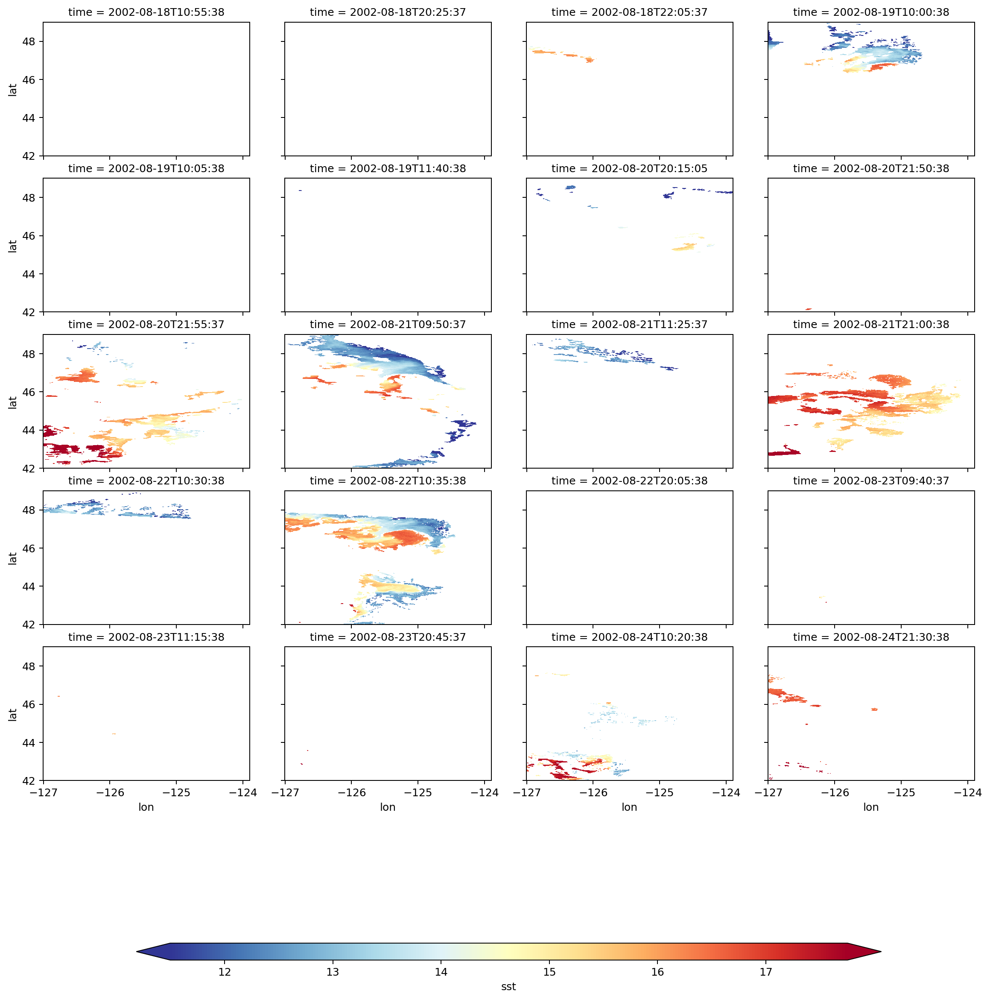

In [15]:
sst.isel(time=slice(120, 140)).plot(
    x="lon",
    col="time",
    col_wrap=4,
    cmap=mpl.cm.RdYlBu_r,
    robust=True,
    cbar_kwargs={"orientation": "horizontal", "aspect": 40, "shrink": 0.8},
)

## Number of morning vs nighttime snapshots

(array([2388., 3557., 2776.,    0.,    0.,    0.,    0.,    0., 3088.,
        5231.]),
 array([ 8. ,  9.4, 10.8, 12.2, 13.6, 15. , 16.4, 17.8, 19.2, 20.6, 22. ]),
 <a list of 10 Patch objects>)

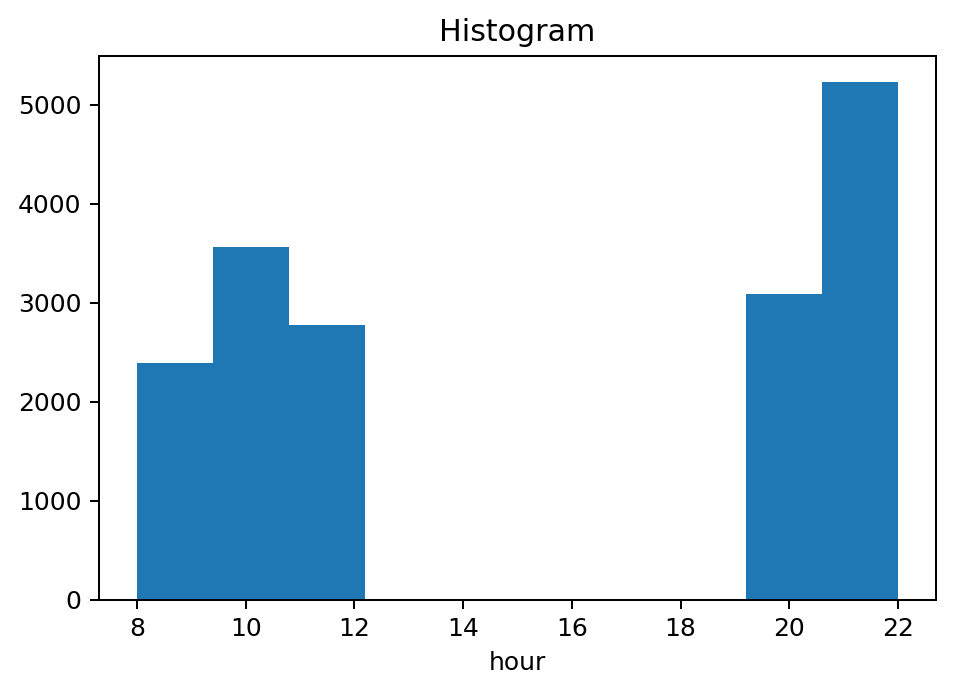

In [16]:
sst.time.dt.hour.plot.hist()

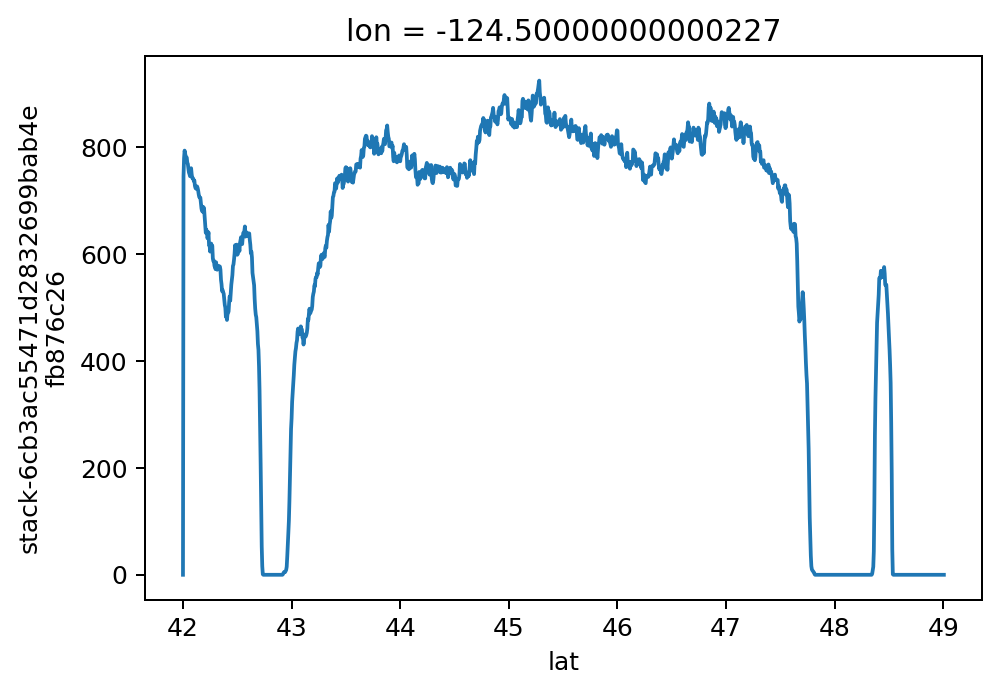

In [17]:
sst.sel(lon=-124.5, method="nearest").count("time").plot()

# Data availability

## Total number

In [32]:
sst["ndays"] = (
    (sst.time[-1] - sst.time[0]).values.astype("timedelta64[D]").astype("float32")
)
sst["count_day"] = sst.where(sst.time.dt.hour < 13, drop=True).count("time")
sst["count_night"] = sst.where(sst.time.dt.hour > 13, drop=True).count("time")
sst.count_day.attrs["long_name"] = "number of valid daytime pixels in 2002-2019"
sst.count_night.attrs["long_name"] = "number of valid morning pixels in 2002-2019"

In [33]:
sst["count_day"], sst["count_night"] = dask.compute(sst.count_day, sst.count_night)

distributed.nanny - WARNING - Worker process still alive after 3 seconds, killing


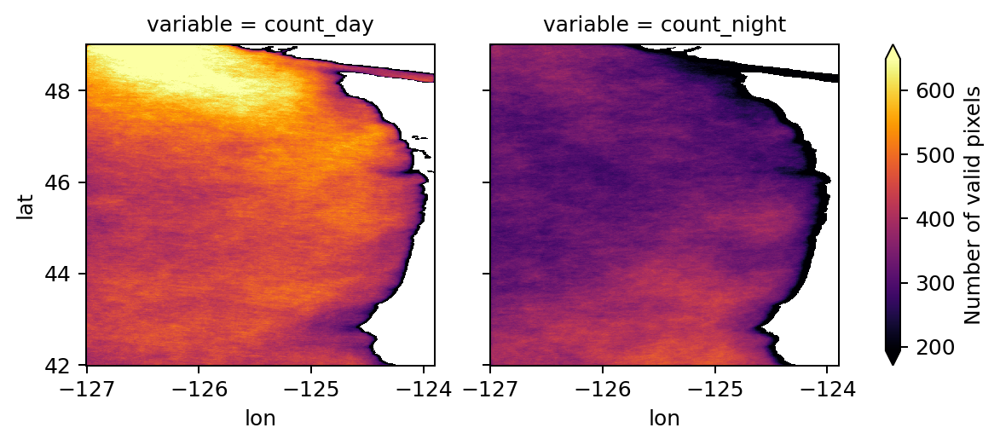

In [36]:
(
    sst.to_dataset()
    .reset_coords()[["count_day", "count_night"]]
    .map(lambda x: x.where(x > 40))
    .to_array(dim="variable")
    .plot(
        robust=True,
        cmap=mpl.cm.inferno,
        col="variable",
        cbar_kwargs={"label": "Number of valid pixels"},
    )
)

## monthwise breakdown

In [12]:
day = sst.chunk({"lon": -1, "time": 120}).where(sst.time.dt.hour < 13, drop=True)
night = sst.chunk({"lon": -1, "time": 120}).where(sst.time.dt.hour > 13, drop=True)
night

,Array,Chunk
Bytes,57.94 GB,333.33 MB
Shape,"(1402, 621, 8319)","(945, 621, 71)"
Count,2558 Tasks,284 Chunks
Type,float64,numpy.ndarray


In [13]:
monthly_counts = xr.Dataset()

monthly_counts["night"] = night.groupby("time.month").count().load()
monthly_counts["day"] = day.groupby("time.month").count().load()
monthly_counts.load()

<xarray.Dataset>
Dimensions:  (lat: 1402, lon: 621, month: 12)
Coordinates:
  * lat      (lat) float64 42.0 42.01 42.01 42.02 ... 48.99 49.0 49.0 49.01
  * lon      (lon) float64 -127.0 -127.0 -127.0 -127.0 ... -123.9 -123.9 -123.9
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    night    (lat, lon, month) int64 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    day      (lat, lon, month) int64 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0

In [53]:
monthly_counts.to_netcdf("/project/mrgoodbar/dcherian/shelfeddy/modis_ql4_monthly_counts.nc")

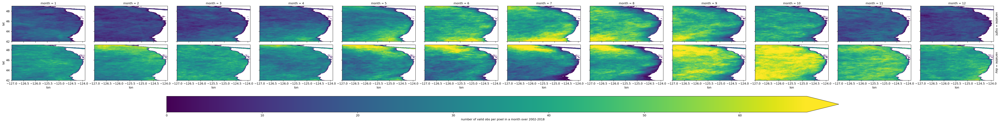

In [14]:
(
    monthly_counts.where(monthly_counts > 0)
    .to_array(dim="variable")
    .plot(
        col="month",
        row="variable",
        vmin=0,
        robust=True,
        aspect=1.3,
        cbar_kwargs={
            "orientation": "horizontal",
            "label": "number of valid obs per pixel in a month over 2002-2018",
            "shrink": 0.8,
            "aspect": 40,
        },
    )
)

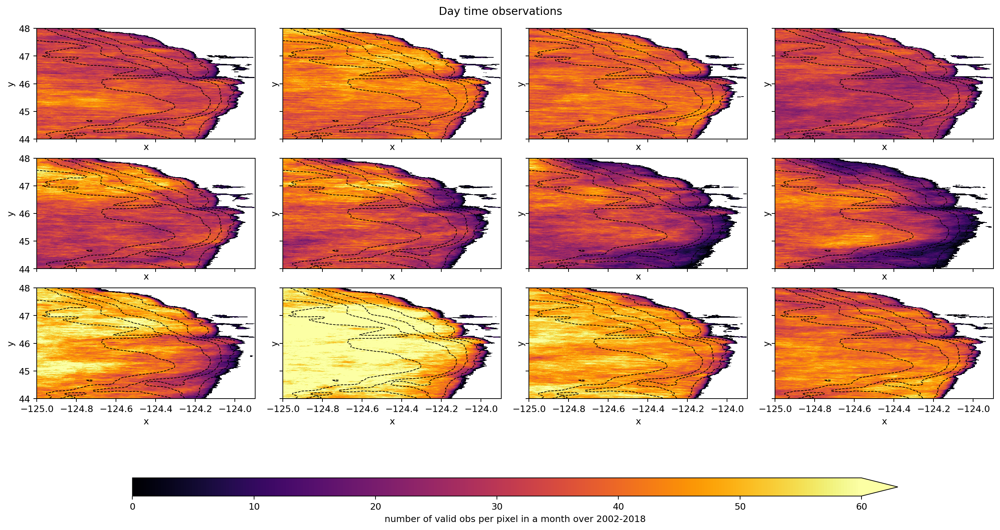

In [15]:
fg = monthly_counts.where(monthly_counts > 0).day.plot(
    col="month",
    col_wrap=4,
    vmin=0,
    vmax=60,
    robust=True,
    aspect=1.2,
    xlim=(-125, None),
    ylim=(44, 48),
    cmap="inferno",
    cbar_kwargs={
        "orientation": "horizontal",
        "label": "number of valid obs per pixel in a month over 2002-2018",
        "shrink": 0.8,
        "aspect": 40,
    },
)
fg.fig.suptitle("Day time observations", y=1)
fg.map(
    lambda: etopo.plot.contour(
        levels=[-200, -100, -75, -50, -25], colors="k", linewidths=0.75
    )
)

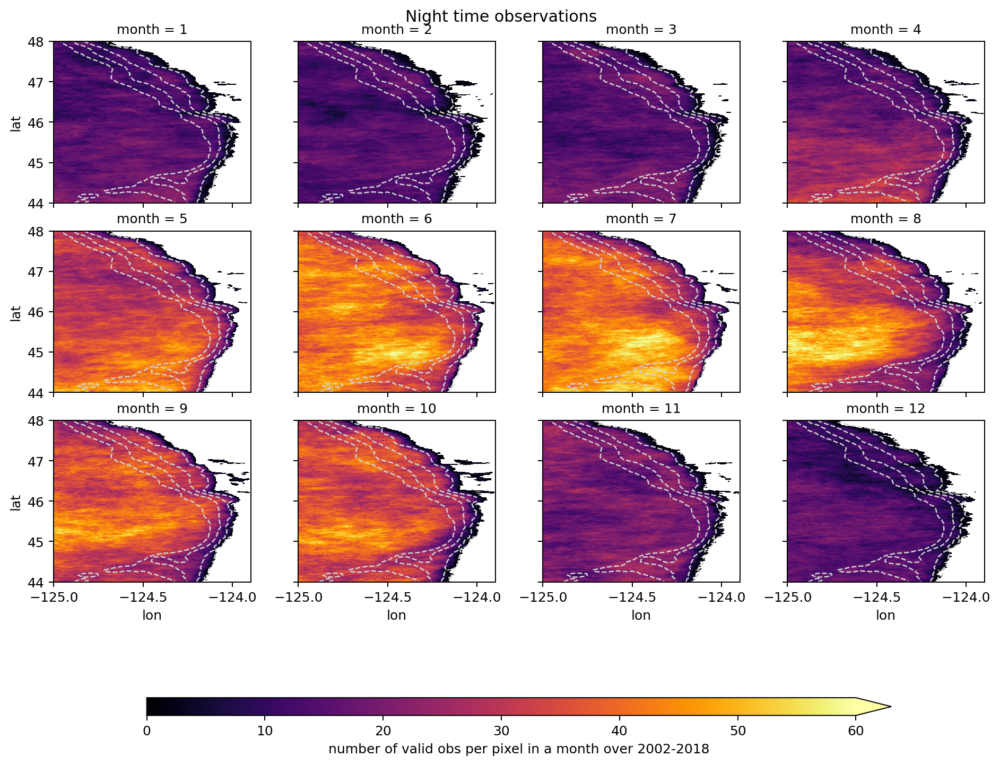

In [44]:
fg = monthly_counts.where(monthly_counts > 0).night.plot(
    col="month",
    col_wrap=4,
    vmin=0,
    vmax=60,
    robust=True,
    aspect=0.8,
    cmap="inferno",
    xlim=(-125, None),
    ylim=(44, 48),
    cbar_kwargs={
        "orientation": "horizontal",
        "label": "number of valid obs per pixel in a month over 2002-2018",
        "shrink": 0.8,
        "aspect": 40,
    },
)
fg.fig.suptitle("Night time observations", y=1)
fg.map(
    lambda: etopo.plot.contour(
        levels=[-100, -75, -50, -25], colors="lightgray", linewidths=1, add_labels=False
    )
)

# Along-isobath variance

Then along a north-south line of your choice, 
1. detrending and then calculating the along-line (~“isobath”) variance in SST for each swath, 
2. using only swaths that have at least 80% data coverage along the line. 
3. Then plot those dots vs. yearday so we can see if there is a seasonal cycle. 
4. Also I was thinking monthly averages of those variances. 
5. But first we have to know if there are ‘enough’ swaths with 80% coverage on a N-S line in each month in the record…

Lets pick a North-South line

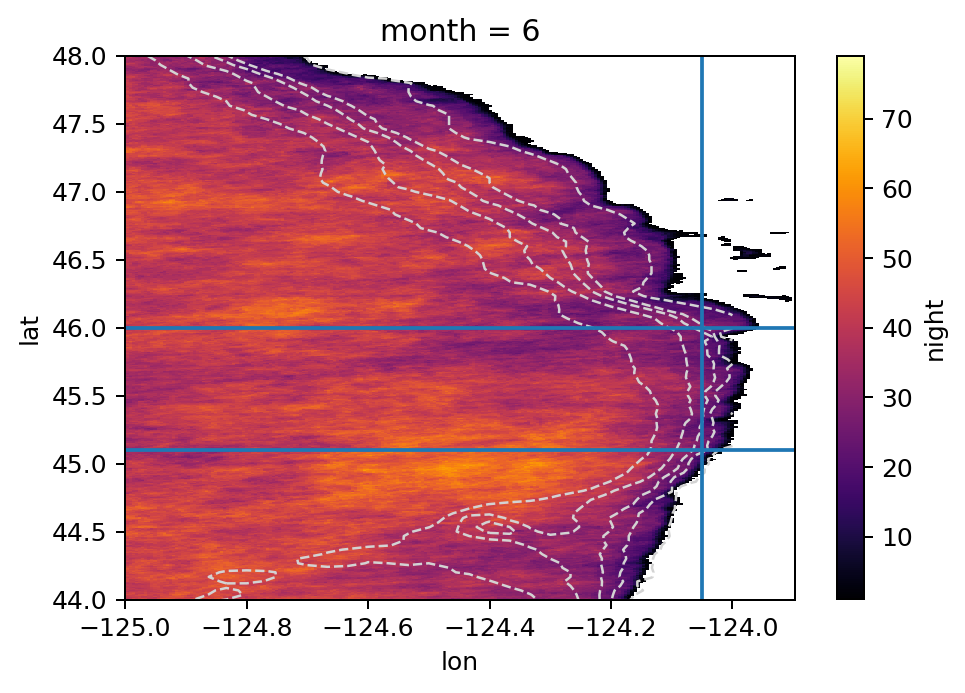

In [56]:
monthly_counts.where(monthly_counts > 0).sel(month=6).night.plot(
    xlim=(-125, None), ylim=(44, 48), cmap="inferno"
)
etopo.plot.contour(
    levels=[-100, -75, -60, -50, -25], colors="lightgray", linewidths=1, add_labels=False
)
plt.axvline(-124.05)
plt.axhline(45.1)
plt.axhline(46)

In [82]:
subset = sst.sel(lon=-124.05, method="nearest").sel(lat=slice(45.1, 46)).persist()
subset

,Array,Chunk
Bytes,24.54 MB,34.56 kB
Shape,"(180, 17040)","(180, 24)"
Count,710 Tasks,710 Chunks
Type,float64,numpy.ndarray


### Data availability 

August is not great, as expected

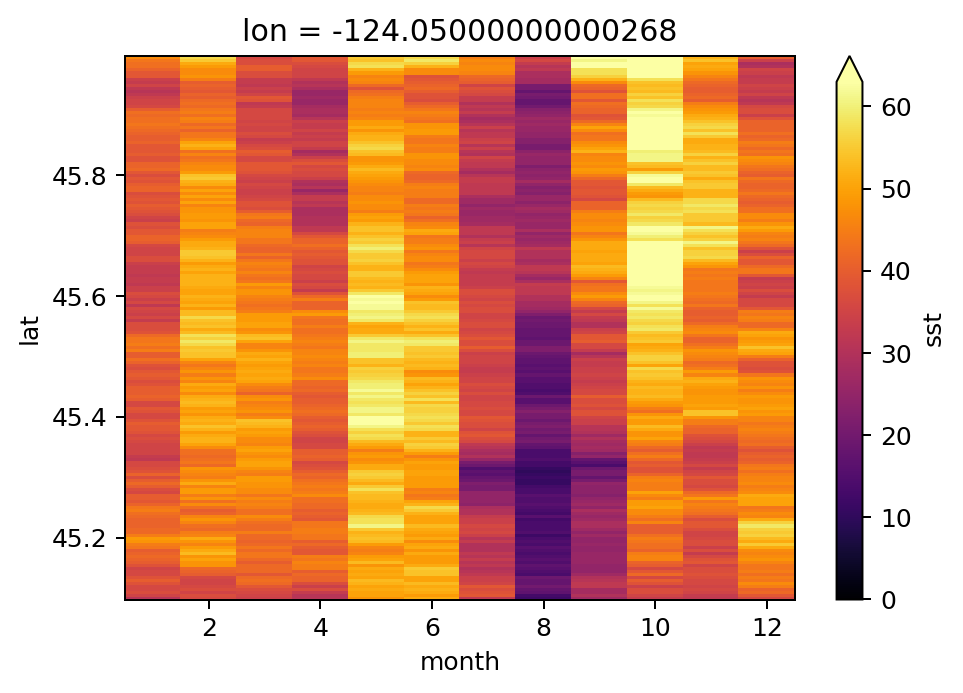

In [119]:
subset.groupby("time.month").count().plot(y="lat", robust=True, cmap="inferno", vmin=0)

Text(0.5, 0.98, 'Number of images with given fractional coverage for each month')

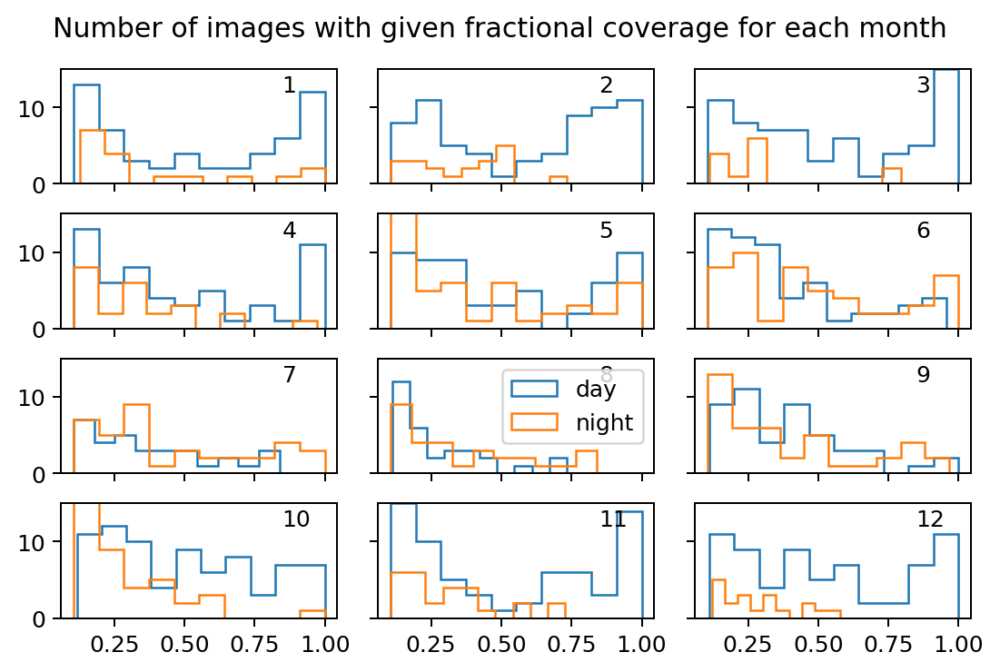

In [117]:
fraction = subset.count("lat") / subset.sizes["lat"]
fraction = fraction.where(fraction > 0.1)
fraction.attrs["long_name"] = "Fraction coverage"


f, axx = plt.subplots(4, 3, sharex=True, sharey=True, constrained_layout=True)
for (label, group), ax in zip(fraction.groupby("time.month"), axx.flat):
    group.where(group.time.dt.hour < 13, drop=True).plot.hist(
        label="day", histtype="step", ax=ax,
    )
    group.where(group.time.dt.hour > 13, drop=True).plot.hist(
        label="night", histtype="step", ax=ax,
    )
    ax.set_xlabel("")
    ax.set_title("")
    ax.text(0.8, 0.8, label, transform=ax.transAxes)

axx[0,0].set_ylim((0, 15))
axx[2, 1].legend()
f.suptitle("Number of images with given fractional coverage for each month")

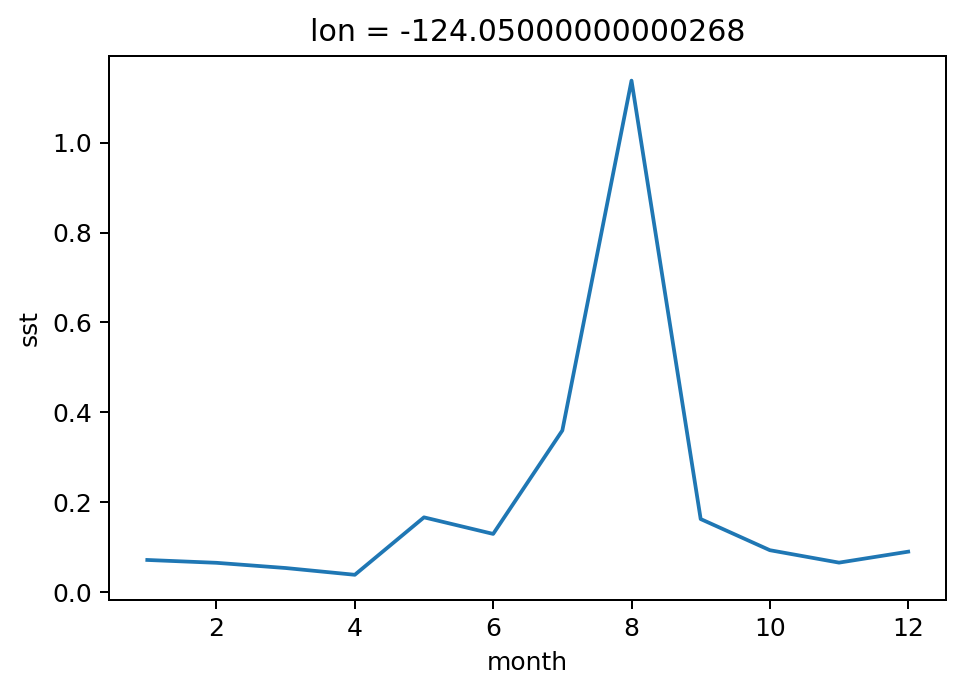

In [87]:
(
    subset.var("lat")
    .where(subset.count("lat") / subset.sizes["lat"] > 0.8)
    .groupby("time.month")
    .mean()
    .plot()
)

# Tomorrow

1. Need a better qualitative color scale for data avialability images.